#  **Importing Libraries**

In [48]:
import os, cv2, json
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns


from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import tensorflow as tf
from tensorflow.keras import models, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications import EfficientNetB6
from tensorflow.keras.applications import InceptionV3

from tensorflow.keras.applications import ResNet50

from tensorflow.keras.optimizers import Adam

from PIL import Image

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Input, BatchNormalization, GlobalAveragePooling2D

# DataFrame

In [49]:
data_dir = '/kaggle/input/harvest-savior/harvest savior'
labels = []
file_paths = []

for label in os.listdir(data_dir):
    class_dir = os.path.join(data_dir, label)
    if os.path.isdir(class_dir):
        for img_file in os.listdir(class_dir):
            file_paths.append(os.path.join(class_dir, img_file))
            labels.append(label)

# Create DataFrame
train = pd.DataFrame({
    'file_path': file_paths,
    'label': labels
})

# Classify

In [50]:
unique_classes = train['label'].unique()
num_classes = len(unique_classes)
print(f'There are {num_classes} unique classes:')
print(unique_classes)

There are 15 unique classes:
['Tomato__septoria_leaf_spot' 'Tomato__healthy' 'Tomato__early_blight'
 'Tomato__yellow_leaf_curl_virus' 'Tomato__target_spot'
 'Tomato__bacterial_spot' 'Chili__whitefly' 'Chili__healthy'
 'Tomato__late_blight' 'Chili__leaf spot'
 'Tomato__spider_mites_(two_spotted_spider_mite)' 'Tomato__leaf_mold'
 'Chili__yellowish' 'Chili__leaf curl' 'Tomato__mosaic_virus']


# Rename Label

In [51]:
label_mapping = {
    'Tomato__septoria_leaf_spot': 'Bercak Daun Septoria pada Tomat',
    'Tomato__healthy': 'Tomat Sehat',
    'Tomato__early_blight': 'Hawar Daun pada Tomat',
    'Tomato__yellow_leaf_curl_virus': 'Virus Kuning pada Tomat',
    'Tomato__target_spot': 'Bercak Daun pada Tomat',
    'Tomato__bacterial_spot': 'Bercak Bakteri pada Tomat',
    'Tomato__late_blight': 'Busuk Daun pada Tomat',
    'Tomato__spider_mites_(two_spotted_spider_mite)': 'Tungau Laba-Laba pada Tomat',
    'Tomato__leaf_mold': 'Jamur Daun pada Tomat',
    'Tomato__mosaic_virus': 'Virus Mosaik pada Tomat',
    'Chili__whitefly': 'Kutu Putih pada Cabai',
    'Chili__healthy': 'Cabai Sehat',
    'Chili__leaf spot': 'Bercak Daun pada Cabai',
    'Chili__yellowish': 'Virus Kuning pada Cabai',
    'Chili__leaf curl': 'Keriting Daun pada Cabai',
}

train['label'] = train['label'].map(label_mapping)

# Verify the mapping
print('Renamed labels:')
print(train['label'].unique())

Renamed labels:
['Bercak Daun Septoria pada Tomat' 'Tomat Sehat' 'Hawar Daun pada Tomat'
 'Virus Kuning pada Tomat' 'Bercak Daun pada Tomat'
 'Bercak Bakteri pada Tomat' 'Kutu Putih pada Cabai' 'Cabai Sehat'
 'Busuk Daun pada Tomat' 'Bercak Daun pada Cabai'
 'Tungau Laba-Laba pada Tomat' 'Jamur Daun pada Tomat'
 'Virus Kuning pada Cabai' 'Keriting Daun pada Cabai'
 'Virus Mosaik pada Tomat']


# Load Images

In [55]:
print('Unique labels:')
print(train['label'].unique())

Unique labels:
['Bercak Daun Septoria pada Tomat' 'Tomat Sehat' 'Hawar Daun pada Tomat'
 'Virus Kuning pada Tomat' 'Bercak Daun pada Tomat'
 'Bercak Bakteri pada Tomat' 'Kutu Putih pada Cabai' 'Cabai Sehat'
 'Busuk Daun pada Tomat' 'Bercak Daun pada Cabai'
 'Tungau Laba-Laba pada Tomat' 'Jamur Daun pada Tomat'
 'Virus Kuning pada Cabai' 'Keriting Daun pada Cabai'
 'Virus Mosaik pada Tomat']


In [56]:
print('Value counts:')
print(train['label'].value_counts())

Value counts:
label
Virus Kuning pada Tomat            3214
Bercak Bakteri pada Tomat          2136
Busuk Daun pada Tomat              1919
Bercak Daun Septoria pada Tomat    1782
Tungau Laba-Laba pada Tomat        1676
Tomat Sehat                        1598
Bercak Daun pada Tomat             1404
Hawar Daun pada Tomat              1009
Jamur Daun pada Tomat               957
Virus Mosaik pada Tomat             382
Kutu Putih pada Cabai               100
Cabai Sehat                         100
Bercak Daun pada Cabai              100
Virus Kuning pada Cabai             100
Keriting Daun pada Cabai            100
Name: count, dtype: int64


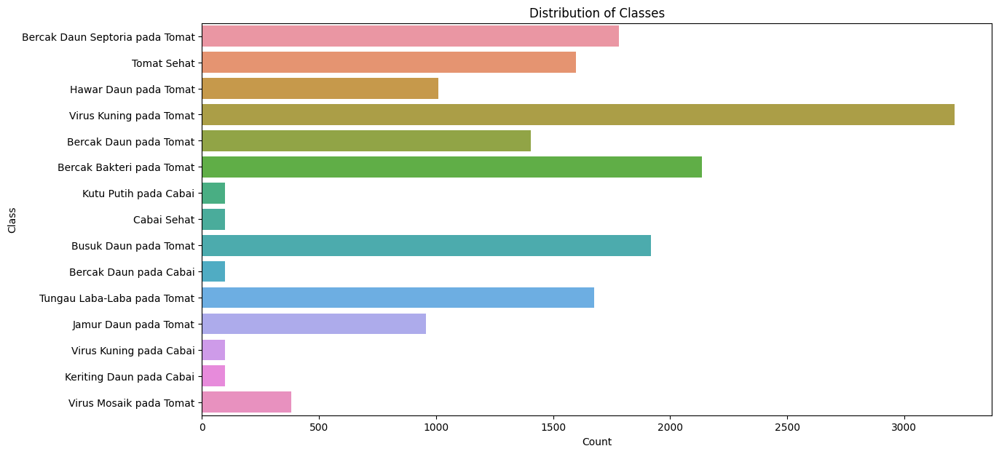

In [57]:
# Basic countplot
plt.figure(figsize=(14, 7))
sns.countplot(data=train, y='label')
plt.title('Distribution of Classes')
plt.xlabel('Count')
plt.ylabel('Class')
plt.show()

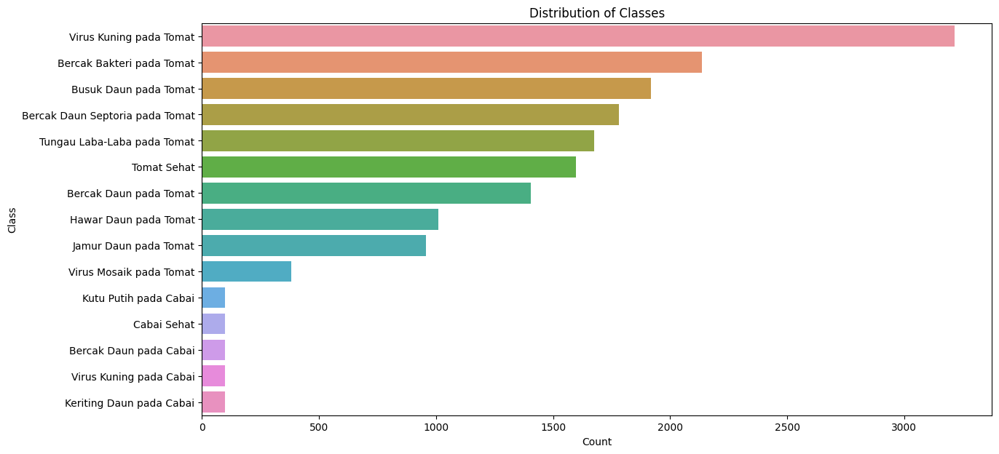

In [58]:
plt.figure(figsize=(14, 7))
sns.countplot(data=train, y='label', order=train['label'].value_counts().index)
plt.title('Distribution of Classes')
plt.xlabel('Count')
plt.ylabel('Class')
plt.show()

# Split Data

In [60]:
# Split the data
df_train, df_validate, y_train, y_test = train_test_split(
    train['file_path'], train['label'],
    train_size=0.8,
    random_state=42,
    stratify=train['label']
)

# Load Images

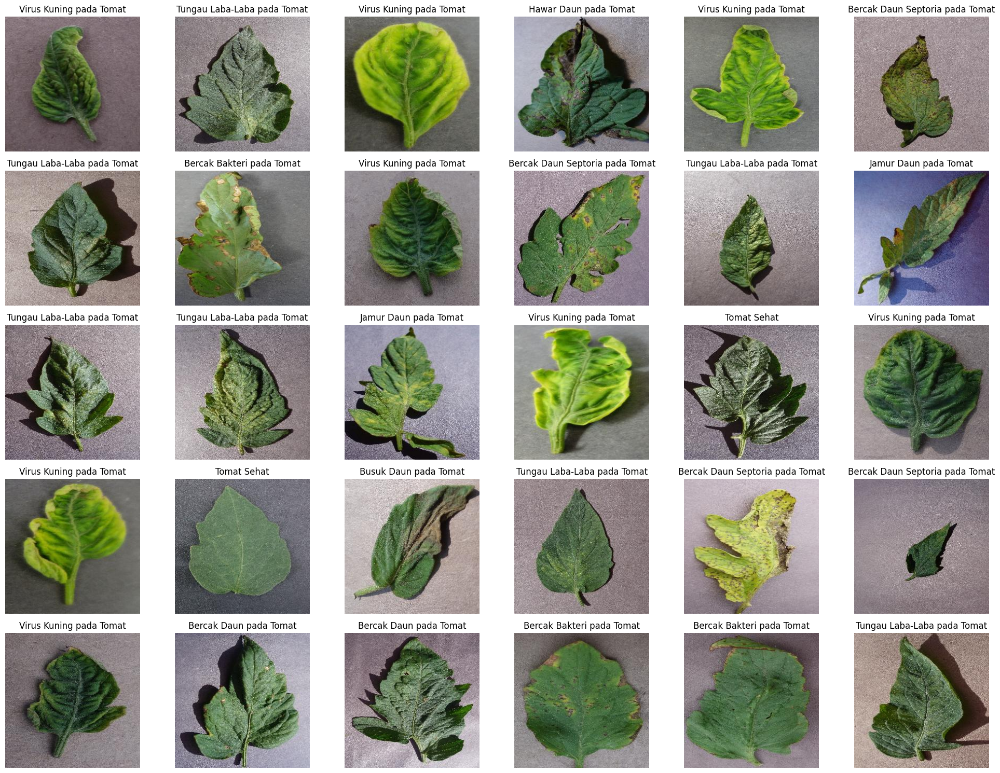

In [62]:
def load_images(image_paths, labels, rows=5, cols=6):
    fig, axes = plt.subplots(rows, cols, figsize=(20, 15))
    axes = axes.flatten()
    
    for img_path, label, ax in zip(image_paths, labels, axes):
        image = Image.open(img_path)
        ax.imshow(image)
        ax.set_title(label)
        ax.axis('off')  # Hide the axis

    plt.tight_layout()
    plt.show()
    
# Select a subset of images to display (e.g., first 30 images)
num_images_to_load = 30
load_image_paths = df_train.iloc[:num_images_to_load]
load_labels = y_train.iloc[:num_images_to_load]

load_images(load_image_paths, load_labels, rows=5, cols=6)

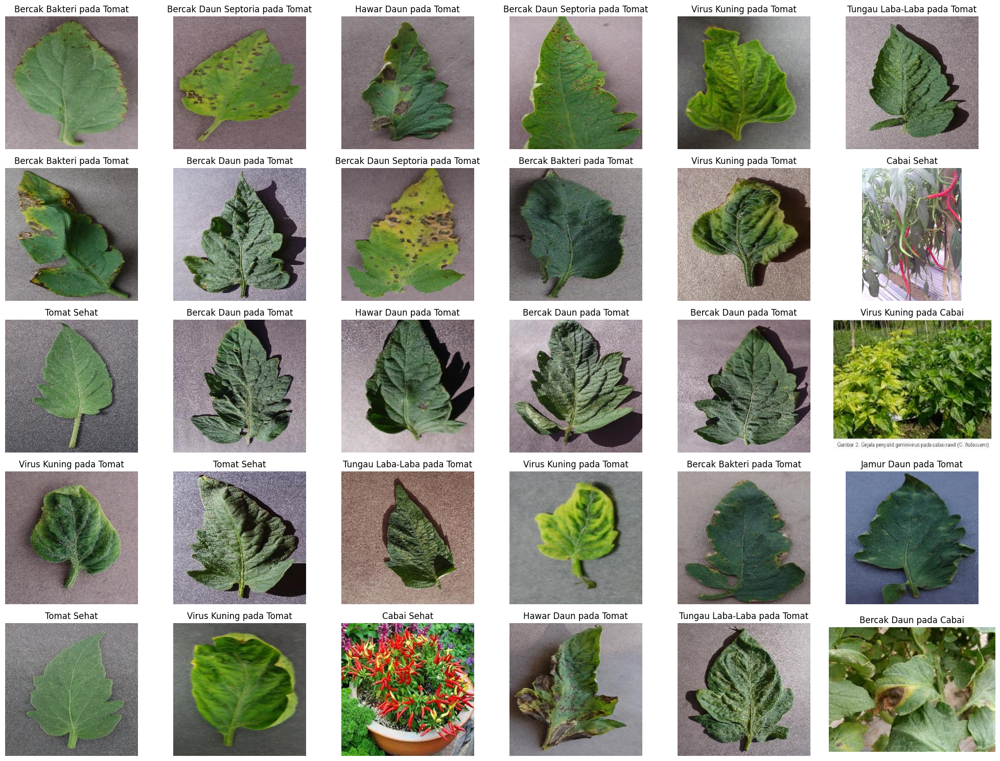

In [63]:
def load_images(image_paths, labels, rows=5, cols=6):
    fig, axes = plt.subplots(rows, cols, figsize=(20, 15))
    axes = axes.flatten()
    
    for img_path, label, ax in zip(image_paths, labels, axes):
        image = Image.open(img_path)
        ax.imshow(image)
        ax.set_title(label)
        ax.axis('off')  # Hide the axis

    plt.tight_layout()
    plt.show()

# Select a subset of images to display (e.g., last 30 images)
num_images_to_load = 30
load_image_paths = df_train.iloc[-num_images_to_load:]
load_labels = y_train.iloc[-num_images_to_load:]

load_images(load_image_paths, load_labels, rows=5, cols=6)

# Image Dimensions

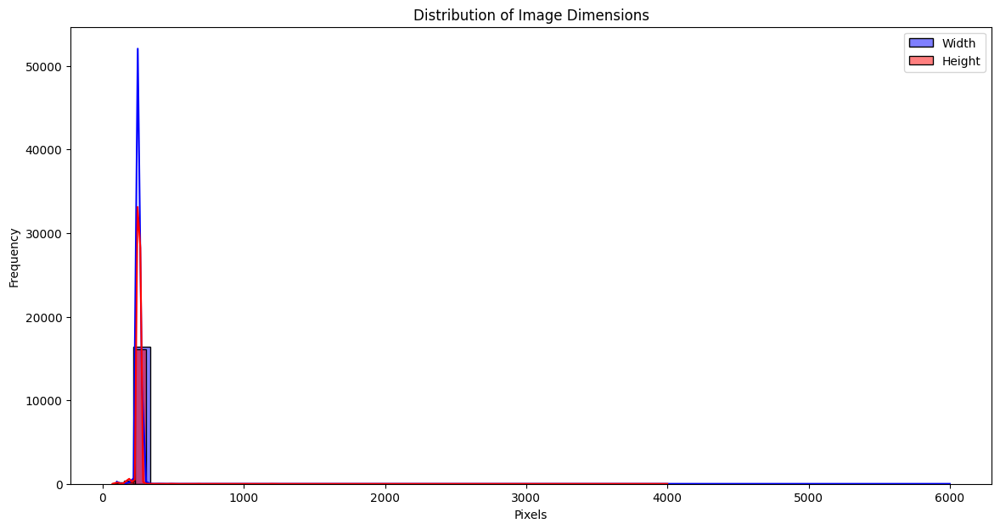

In [64]:
# Image Dimensions
image_dimensions = []

for file_path in train['file_path']:
    img = Image.open(file_path)
    image_dimensions.append(img.size)

# Create DataFrame for image dimensions
dim_df = pd.DataFrame(image_dimensions, columns=['width', 'height'])

# Plot distribution of image dimensions
plt.figure(figsize=(14, 7))
sns.histplot(dim_df['width'], kde=True, label='Width', color='blue', bins=50)
sns.histplot(dim_df['height'], kde=True, label='Height', color='red', bins=50)
plt.legend()
plt.title('Distribution of Image Dimensions')
plt.xlabel('Pixels')
plt.ylabel('Frequency')
plt.show()

# Image Statistics

In [65]:
# Image Statistics (mean and std of pixel values)
def compute_image_stats(file_paths):
    means = []
    stds = []

    for file_path in file_paths:
        img = Image.open(file_path).convert('RGB')
        img_array = np.array(img) / 255.0
        means.append(np.mean(img_array, axis=(0, 1)))
        stds.append(np.std(img_array, axis=(0, 1)))

    return np.mean(means, axis=0), np.mean(stds, axis=0)

mean, std = compute_image_stats(train['file_path'])

print(f'Mean pixel values: {mean}')
print(f'Std of pixel values: {std}')

Mean pixel values: [0.45114148 0.46664711 0.40402753]
Std of pixel values: [0.16845685 0.14802337 0.18385641]
